In [15]:
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset
import IPython.display as ipd
from scipy.io.wavfile import read
import torch.nn as nn
import matplotlib.pyplot as plt
import soundfile as sf

In [16]:
# functions used in the whole lab
def read_sound(file):
  """ read a mono wav sound file, assuming is mono, and convert it to a floating point array
    Args:
      file (str): File name
    Returns:
      sound_array (numpy.array): Array of samples as floating point values between -1 and 1
      sampling_rate (int): Sampling rate
  """
  # read sound file
  sampling_rate, x = read(file)
  # convert to floating point values between -1 and 1, assuming x are 16 bit integers
  sound_array = np.float32(x) / 2**15
  return sound_array, sampling_rate

def display_sound(sound_array, sampling_rate=44100):
  """ Display signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  # plot the waveform of the sound
  plt.figure(0, figsize=(10, 4))
  time_indexes = np.linspace(0, sound_array.size/sampling_rate, sound_array.size)
  plt.plot(time_indexes, sound_array)
  plt.xlabel('time (seconds)')
  plt.ylabel('amplitude')
  plt.show()
  # play the sound
  ipd.display(ipd.Audio(data=sound_array, rate=sampling_rate))

In [19]:
# Custom Dataset class for loading and segmenting audio data into fixed-length segments
class AudioDataset(Dataset):
    def __init__(self, signal, segment_length=16000):
        """
        Initializes the AudioDataset with the given audio signal and segment length.

        Args:
            signal (Tensor): The full audio signal to be segmented.
            segment_length (int): The length of each segment in samples (default: 16000).
        """
        self.signal = signal
        self.segment_length = segment_length

    def __len__(self):
        """
        Returns the number of segments in the dataset by dividing the total
        signal length by the segment length. This ensures each segment is of
        equal length.
        """
        return len(self.signal) // self.segment_length

    def __getitem__(self, idx):
        """
        Retrieves a segment of the audio signal based on the index.

        Args:
            idx (int): The index of the segment.

        Returns:
            Tensor: A segment of the audio signal of length `segment_length`.
        """
        start = idx * self.segment_length  # Calculate start index of the segment
        end = start + self.segment_length  # Calculate end index of the segment
        return self.signal[start:end]      # Return the audio segment


# Convolutional Autoencoder architecture with Conv1D layers for encoding and ConvTranspose1D for decoding
class ConvAutoencoder(nn.Module):
    def __init__(self):
        """
        Initializes the ConvAutoencoder with separate encoder and decoder blocks.
        The architecture reduces the input signal dimensionality in the encoder 
        and reconstructs it in the decoder.
        """
        super(ConvAutoencoder, self).__init__()

        # Encoder: Reduces input dimensions and learns compressed representations
        self.encoder = nn.Sequential(
            # First convolutional layer: downsampling by a factor of 512
            nn.Conv1d(in_channels=1, out_channels=1024, kernel_size=2048, stride=512, padding=1023, bias=True),
            nn.ReLU(),  # Activation function
            
            # Second convolutional layer: reduces dimensionality to 256 channels
            nn.Conv1d(in_channels=1024, out_channels=256, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),  # Activation function
            
            # Third convolutional layer: further reduces dimensionality to 64 channels
            nn.Conv1d(in_channels=256, out_channels=64, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU()  # Activation function
        )

        # Decoder: Reconstructs the signal from the compressed latent representation
        self.decoder = nn.Sequential(
            # First transposed convolutional layer: expands dimensionality to 256 channels
            nn.ConvTranspose1d(in_channels=64, out_channels=256, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),  # Activation function
            
            # Second transposed convolutional layer: expands dimensionality to 1024 channels
            nn.ConvTranspose1d(in_channels=256, out_channels=1024, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),  # Activation function
            
            # Third transposed convolutional layer: upsampling to the original size with stride 512
            nn.ConvTranspose1d(in_channels=1024, out_channels=1, kernel_size=2048, stride=512, padding=1023, bias=True)
        )

    def forward(self, x):
        """
        Defines the forward pass for the autoencoder.

        Args:
            x (Tensor): The input audio signal.

        Returns:
            Tensor: The reconstructed signal.
        """
        # Pass the input through the encoder to obtain the compressed representation
        x = self.encoder(x)
        
        # Pass the compressed representation through the decoder to reconstruct the signal
        x = self.decoder(x)
        
        return x  # Return the reconstructed signal

def train_autoencoder(model, data_loader, num_epochs, device):
    """
    Trains an autoencoder model using Mean Squared Error (MSE) loss and Adam optimizer.

    Args:
        model (nn.Module): The autoencoder model to train.
        data_loader (DataLoader): DataLoader providing batches of audio segments.
        num_epochs (int): Number of training epochs.
        device (torch.device): Device to run the training on (CPU or GPU).
    """
    
    # Define the Mean Squared Error loss function
    criterion = nn.MSELoss()  # Measures reconstruction error by comparing output to input

    # Initialize the Adam optimizer with a learning rate of 1e-4
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    # List to store loss values for each epoch, useful for plotting loss curve
    training_loss = []

    # Training loop over specified number of epochs
    for epoch in range(num_epochs):
        running_loss = 0.0  # Accumulate the loss over each batch

        # Set model to training mode to enable dropout, batchnorm, etc., if present
        model.train()

        # Iterate over each batch of data from the data_loader
        for i, batch in enumerate(data_loader):
            # Prepare the batch by adding a channel dimension and moving it to the device
            # Shape changes from [B, L] to [B, 1, L] (batch_size x channels x length)
            batch = batch.unsqueeze(1).to(device)
            
            # Zero the gradients for the optimizer to prevent accumulation
            optimizer.zero_grad()

            # Forward pass: compute the model's output for the current batch
            outputs = model(batch)
            
            # Compute the MSE loss between the model's output and the input
            # `batch[..., :outputs.size(-1)]` trims the input to match the output length
            loss = criterion(outputs, batch[..., :outputs.size(-1)])

            # Backward pass: calculate gradients for each parameter
            loss.backward()

            # Update model parameters based on computed gradients
            optimizer.step()

            # Accumulate the batch loss to compute average loss over the epoch
            running_loss += loss.item()

        # Calculate average loss over all batches in this epoch
        avg_loss = running_loss / len(data_loader)
        training_loss.append(avg_loss)  # Store average loss for plotting

        # Print progress every 10 epochs to monitor training
        if epoch % 10 == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.6f}')

        # Optional: Visualize original and reconstructed signals every 100 epochs
        if epoch % 100 == 0:  # Call visualization function every 100 epochs
            visualize_reconstruction(model, data_loader, device)

    # Plot training loss over epochs for visual analysis
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), training_loss, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.title('Training Loss over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

def visualize_reconstruction(model, data_loader, device):
    """
    Visualizes the original and reconstructed signals for a batch of data
    to assess the quality of the model's reconstruction.

    Args:
        model (nn.Module): The trained autoencoder model.
        data_loader (DataLoader): DataLoader to fetch a batch of audio segments.
        device (torch.device): Device to run the model on (CPU or GPU).
    """

    # Switch model to evaluation mode to disable dropout, batchnorm, etc.
    model.eval()

    # Obtain a batch of data from the data loader
    with torch.no_grad():  # Disable gradient computation for inference
        batch = next(iter(data_loader))  # Get the first batch of data
        batch = batch.unsqueeze(1).to(device)  # Add a channel dimension, shape [B, 1, L]

        # Forward pass through the model to get the reconstructed output
        recon = model(batch)

    # Convert the original and reconstructed tensors to numpy arrays for plotting
    original = batch.squeeze().cpu().numpy()      # Remove channel dimension and move to CPU
    reconstructed = recon.squeeze().cpu().numpy() # Remove channel dimension and move to CPU

    # Set the number of samples to plot (up to 5 samples)
    num_samples = 5
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, num_samples * 3))

    # Plot the original and reconstructed signals side by side for each sample
    for i in range(num_samples):
        # Plot the original signal
        axs[i, 0].plot(original[i])
        axs[i, 0].set_title(f'Original Signal {i + 1}')
        axs[i, 0].set_xlim([0, len(original[i])])

        # Plot the reconstructed signal
        axs[i, 1].plot(reconstructed[i])
        axs[i, 1].set_title(f'Reconstructed Signal {i + 1}')
        axs[i, 1].set_xlim([0, len(reconstructed[i])])

    # Adjust layout for better readability
    plt.tight_layout()
    plt.show()

# Encode the audio into its latent representation
def encode_audio(model, audio_signal, device):
    """
    Encodes an audio signal into a latent representation using the encoder part of the model.

    Args:
        model (nn.Module): The autoencoder model containing an encoder.
        audio_signal (array or Tensor): The input audio signal to be encoded.
        device (torch.device): Device to run the encoding on (CPU or GPU).

    Returns:
        Tensor: The latent representation of the audio signal.
    """
    
    # Set the model to evaluation mode to disable training-specific layers like dropout
    model.eval()

    # Convert audio signal from NumPy array to Tensor if needed
    if isinstance(audio_signal, np.ndarray):
        audio_signal = torch.from_numpy(audio_signal)

    with torch.no_grad():  # Disable gradient tracking for efficiency
        # Add batch and channel dimensions, then move to device
        # Shape changes from [L] to [1, 1, L] (batch_size x channels x length)
        audio_signal = audio_signal.unsqueeze(0).unsqueeze(1).to(device)
        
        # Pass the audio through the encoder to obtain the latent representation
        latent = model.encoder(audio_signal)
        
    return latent  # Return the encoded (latent) representation of the audio

# Decode the latent representation back to the original space
def decode_audio(model, latent_rep, device):
    """
    Decodes a latent representation back to the original audio space using the model's decoder.

    Args:
        model (nn.Module): The autoencoder model containing a decoder.
        latent_rep (Tensor): The latent representation to be decoded.
        device (torch.device): Device to run the decoding on (CPU or GPU).

    Returns:
        np.ndarray: The reconstructed audio signal in the original space.
    """
    
    # Set the model to evaluation mode to ensure consistency in output
    model.eval()

    with torch.no_grad():  # Disable gradient tracking for inference
        # Decode the latent representation using the model's decoder
        reconstructed = model.decoder(latent_rep).squeeze().cpu().numpy()  # Remove batch/channel dimensions

    return reconstructed  # Return the reconstructed audio signal as a NumPy array

# Plot the original and reconstructed audio signals
def plot_signals(original, reconstructed, sample_rate):
    """
    Plots the original and reconstructed audio signals for comparison.

    Args:
        original (array-like): The original audio signal.
        reconstructed (array-like): The reconstructed audio signal.
        sample_rate (int): The sample rate of the audio signals.
    """
    
    plt.figure(figsize=(10, 4))
    plt.plot(original, label='Original Signal')
    plt.plot(reconstructed, label='Reconstructed Signal', linestyle='dashed')
    plt.legend()
    plt.title('Original vs Reconstructed Audio Signal')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

# Save the reconstructed audio to a file
def save_audio(reconstructed_signal, sample_rate, filename='reconstructed_audio.wav'):
    """
    Saves the reconstructed audio signal to a .wav file.

    Args:
        reconstructed_signal (array-like): The audio signal to save.
        sample_rate (int): The sample rate to use for the saved audio.
        filename (str): The name of the output file (default: 'reconstructed_audio.wav').
    """
    
    # Use the soundfile library to write the audio signal to a WAV file
    sf.write(filename, reconstructed_signal, sample_rate)

Epoch [1/1001], Loss: 0.009077


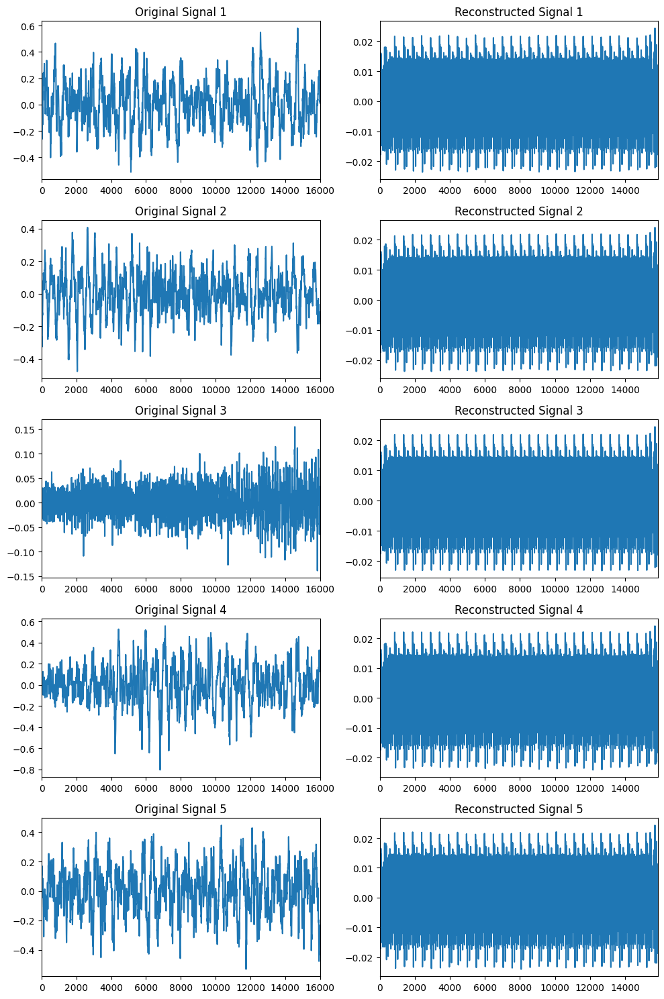

Epoch [11/1001], Loss: 0.009747
Epoch [21/1001], Loss: 0.005795
Epoch [31/1001], Loss: 0.004529
Epoch [41/1001], Loss: 0.004263
Epoch [51/1001], Loss: 0.004041
Epoch [61/1001], Loss: 0.003716
Epoch [71/1001], Loss: 0.003473
Epoch [81/1001], Loss: 0.003135
Epoch [91/1001], Loss: 0.002762
Epoch [101/1001], Loss: 0.002489


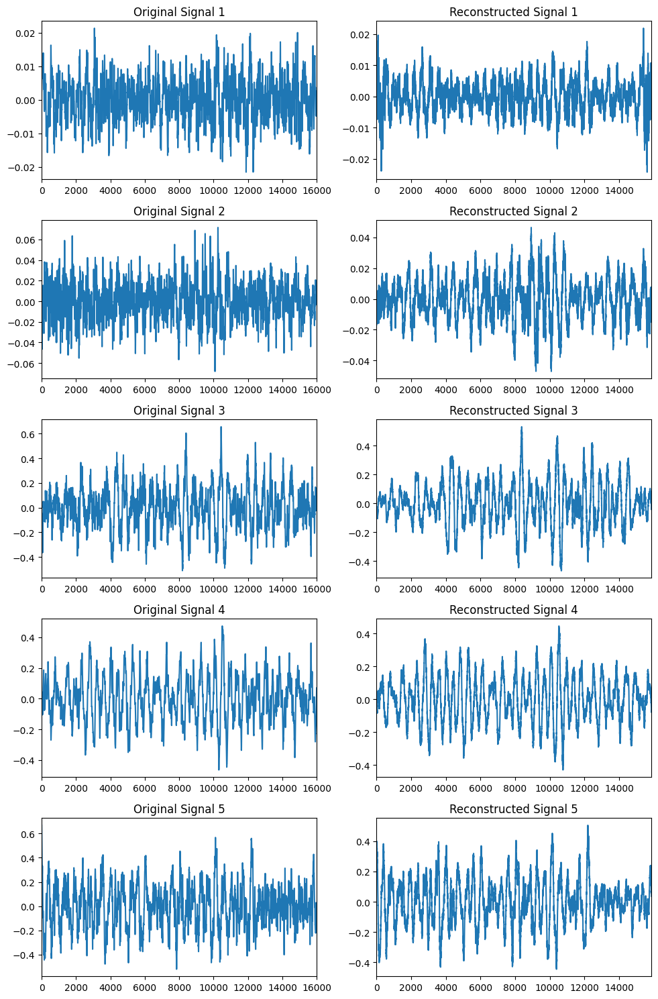

Epoch [111/1001], Loss: 0.002373
Epoch [121/1001], Loss: 0.002161
Epoch [131/1001], Loss: 0.002081
Epoch [141/1001], Loss: 0.001928
Epoch [151/1001], Loss: 0.001875
Epoch [161/1001], Loss: 0.001673
Epoch [171/1001], Loss: 0.001553
Epoch [181/1001], Loss: 0.001501
Epoch [191/1001], Loss: 0.001298
Epoch [201/1001], Loss: 0.001255


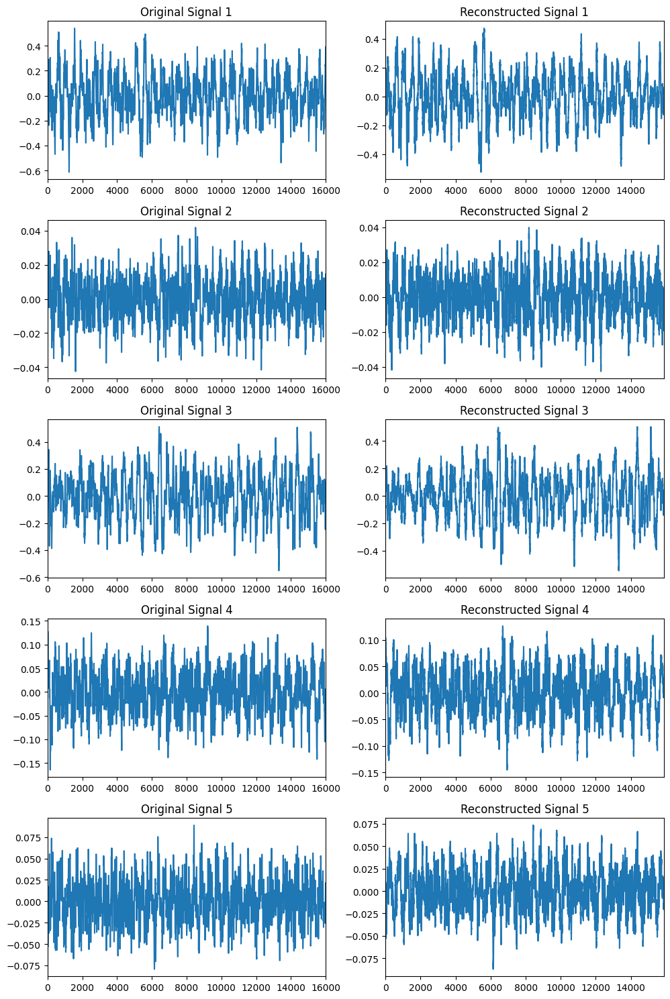

Epoch [211/1001], Loss: 0.001171
Epoch [221/1001], Loss: 0.001106
Epoch [231/1001], Loss: 0.001044
Epoch [241/1001], Loss: 0.000987
Epoch [251/1001], Loss: 0.000938
Epoch [261/1001], Loss: 0.000935
Epoch [271/1001], Loss: 0.000868
Epoch [281/1001], Loss: 0.000824
Epoch [291/1001], Loss: 0.000812
Epoch [301/1001], Loss: 0.000763


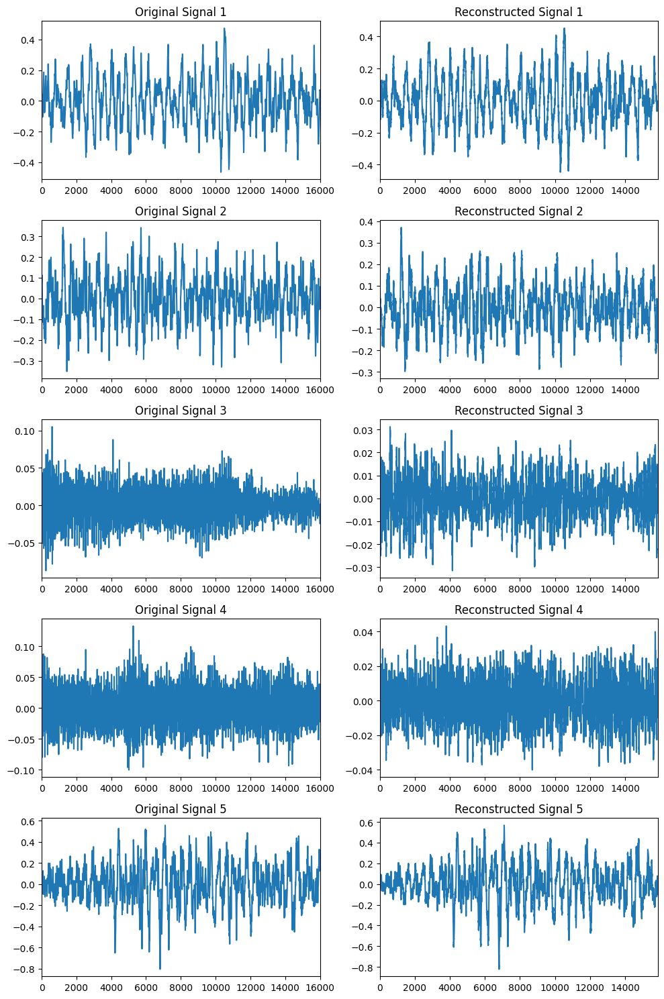

Epoch [311/1001], Loss: 0.000731
Epoch [321/1001], Loss: 0.000727
Epoch [331/1001], Loss: 0.000687
Epoch [341/1001], Loss: 0.000697
Epoch [351/1001], Loss: 0.000650
Epoch [361/1001], Loss: 0.000645
Epoch [371/1001], Loss: 0.000621
Epoch [381/1001], Loss: 0.000587
Epoch [391/1001], Loss: 0.000574
Epoch [401/1001], Loss: 0.000558


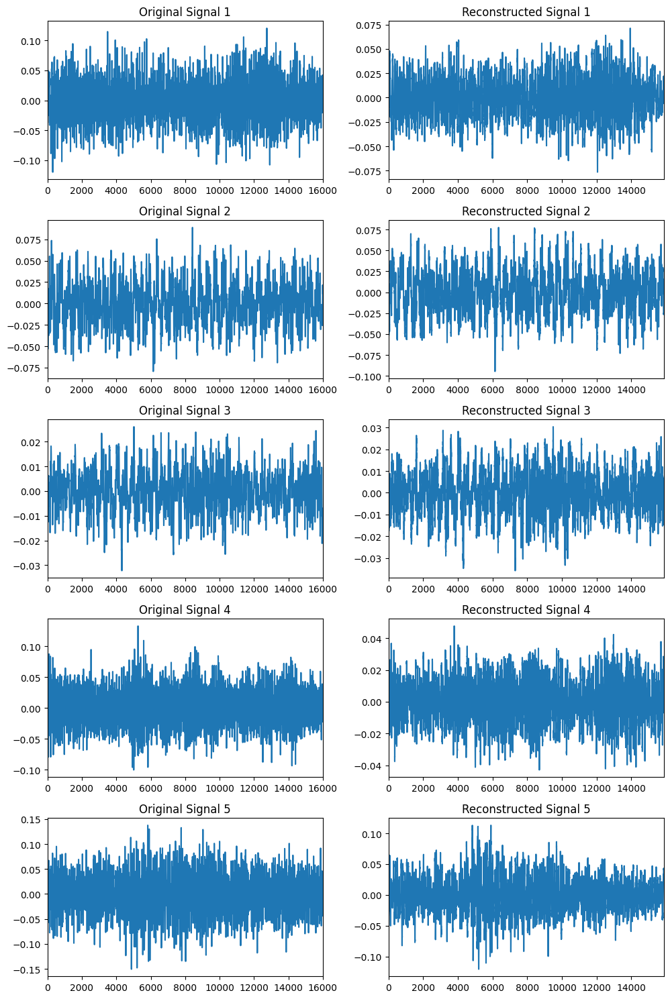

Epoch [411/1001], Loss: 0.000563
Epoch [421/1001], Loss: 0.000530
Epoch [431/1001], Loss: 0.000510
Epoch [441/1001], Loss: 0.000515
Epoch [451/1001], Loss: 0.000517
Epoch [461/1001], Loss: 0.000498
Epoch [471/1001], Loss: 0.000457
Epoch [481/1001], Loss: 0.000456
Epoch [491/1001], Loss: 0.000447
Epoch [501/1001], Loss: 0.000439


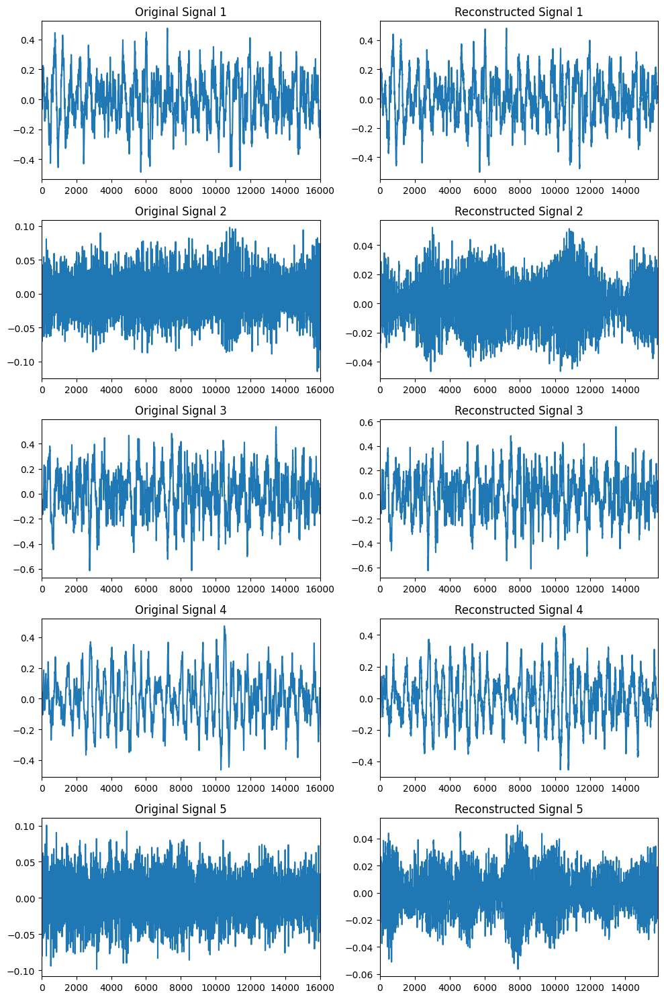

Epoch [511/1001], Loss: 0.000428
Epoch [521/1001], Loss: 0.000425
Epoch [531/1001], Loss: 0.000407
Epoch [541/1001], Loss: 0.000395
Epoch [551/1001], Loss: 0.000392
Epoch [561/1001], Loss: 0.000388
Epoch [571/1001], Loss: 0.000370
Epoch [581/1001], Loss: 0.000367
Epoch [591/1001], Loss: 0.000368
Epoch [601/1001], Loss: 0.000355


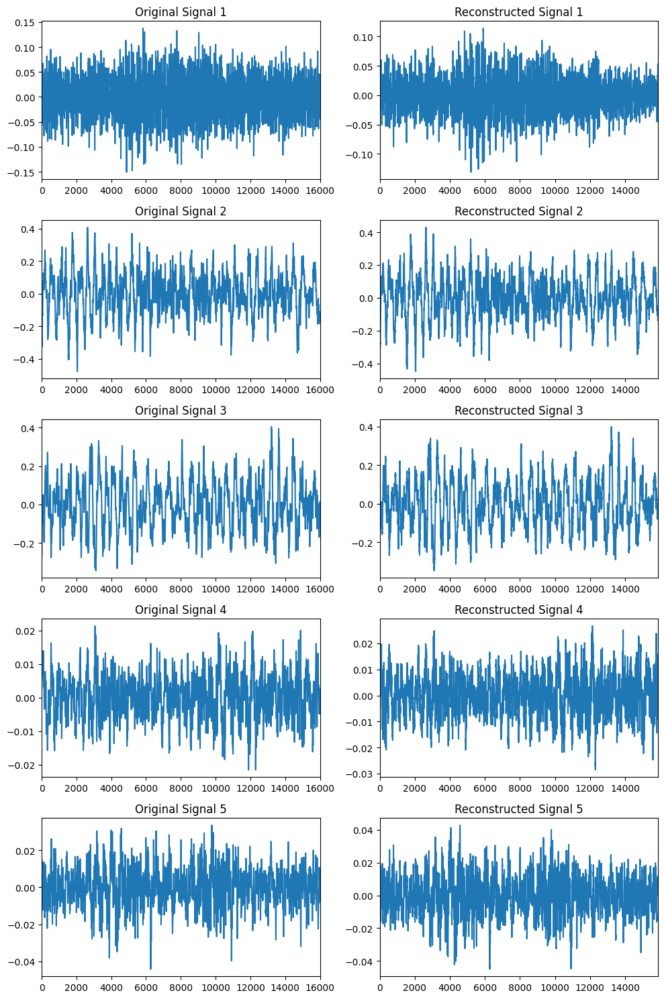

Epoch [611/1001], Loss: 0.000343
Epoch [621/1001], Loss: 0.000345
Epoch [631/1001], Loss: 0.000332
Epoch [641/1001], Loss: 0.000423
Epoch [651/1001], Loss: 0.000334
Epoch [661/1001], Loss: 0.000334
Epoch [671/1001], Loss: 0.000318
Epoch [681/1001], Loss: 0.000316
Epoch [691/1001], Loss: 0.000305
Epoch [701/1001], Loss: 0.000302


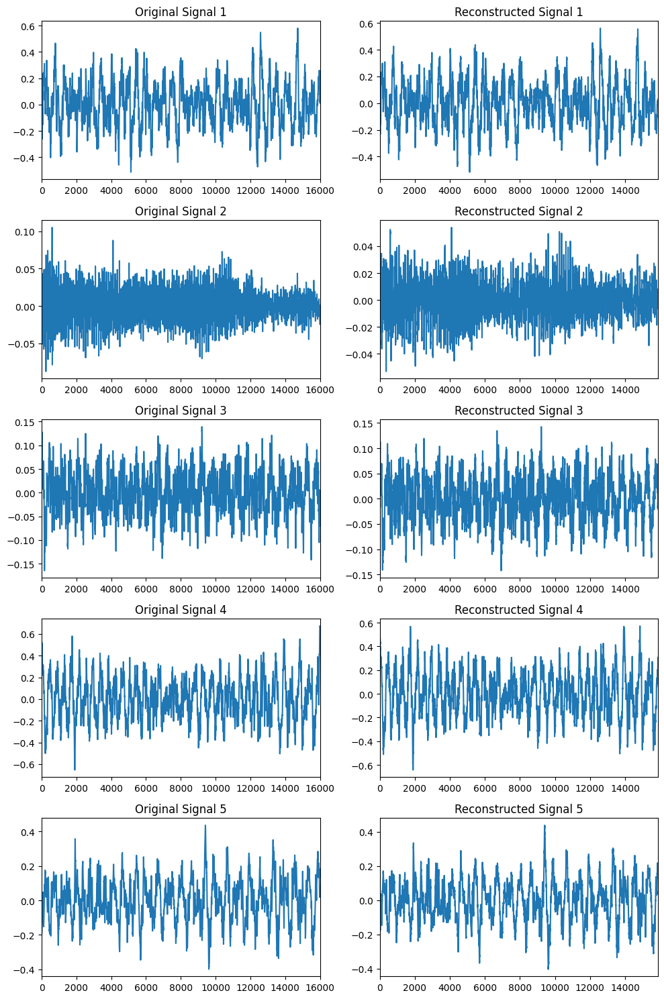

Epoch [711/1001], Loss: 0.000303
Epoch [721/1001], Loss: 0.000295
Epoch [731/1001], Loss: 0.000292
Epoch [741/1001], Loss: 0.000283
Epoch [751/1001], Loss: 0.000285
Epoch [761/1001], Loss: 0.000286
Epoch [771/1001], Loss: 0.000286
Epoch [781/1001], Loss: 0.000295
Epoch [791/1001], Loss: 0.000266
Epoch [801/1001], Loss: 0.000274


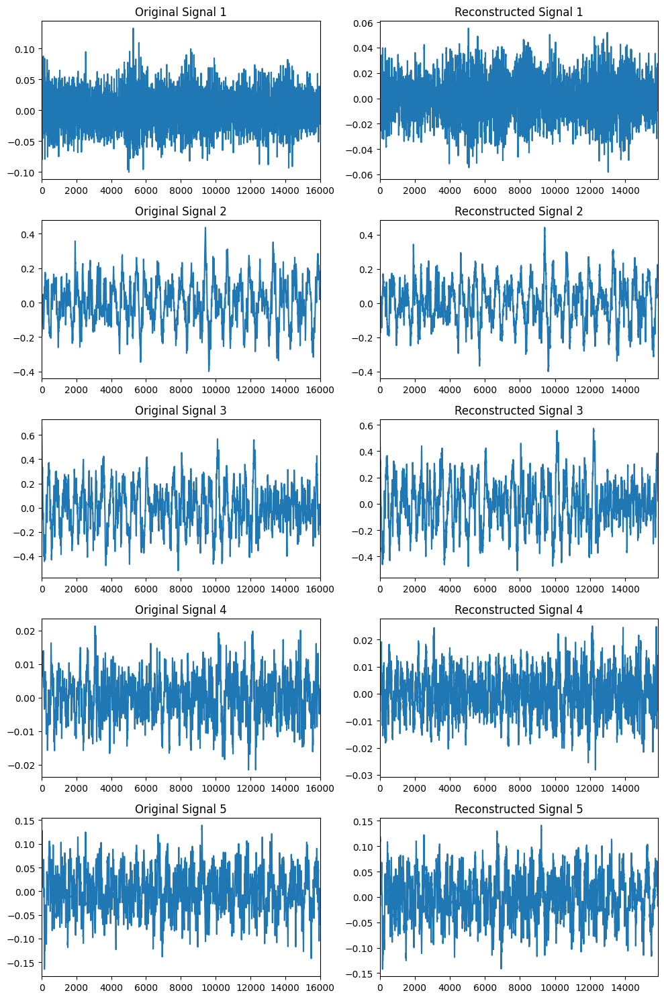

Epoch [811/1001], Loss: 0.000259
Epoch [821/1001], Loss: 0.000265
Epoch [831/1001], Loss: 0.000256
Epoch [841/1001], Loss: 0.000252
Epoch [851/1001], Loss: 0.000254
Epoch [861/1001], Loss: 0.000252
Epoch [871/1001], Loss: 0.000253
Epoch [881/1001], Loss: 0.000257
Epoch [891/1001], Loss: 0.000247
Epoch [901/1001], Loss: 0.000240


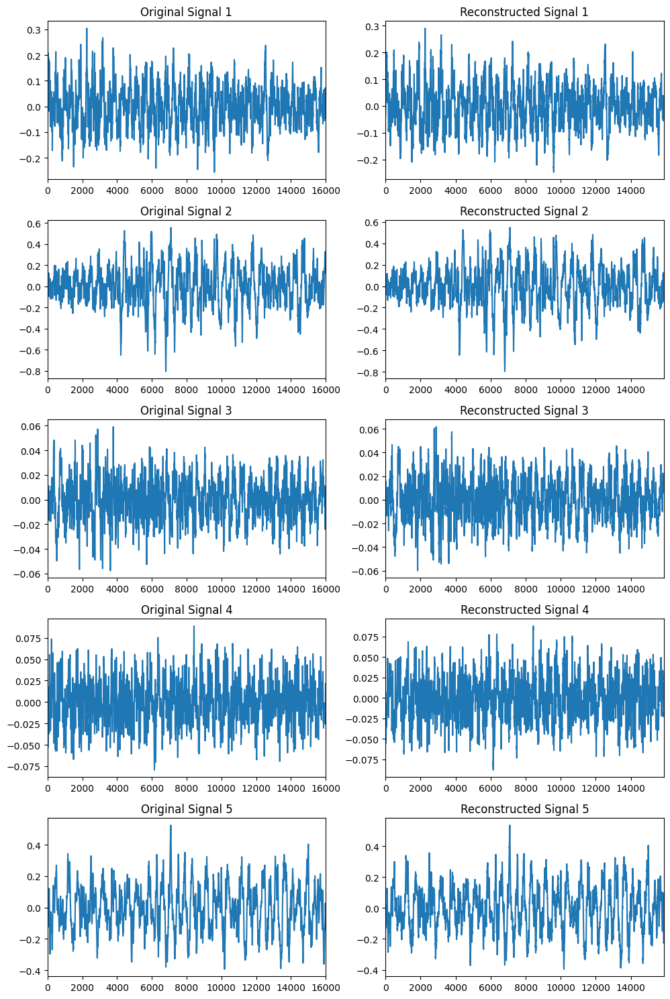

Epoch [911/1001], Loss: 0.000253
Epoch [921/1001], Loss: 0.000267
Epoch [931/1001], Loss: 0.000246
Epoch [941/1001], Loss: 0.000226
Epoch [951/1001], Loss: 0.000217
Epoch [961/1001], Loss: 0.000224
Epoch [971/1001], Loss: 0.000220
Epoch [981/1001], Loss: 0.000219
Epoch [991/1001], Loss: 0.000214
Epoch [1001/1001], Loss: 0.000214


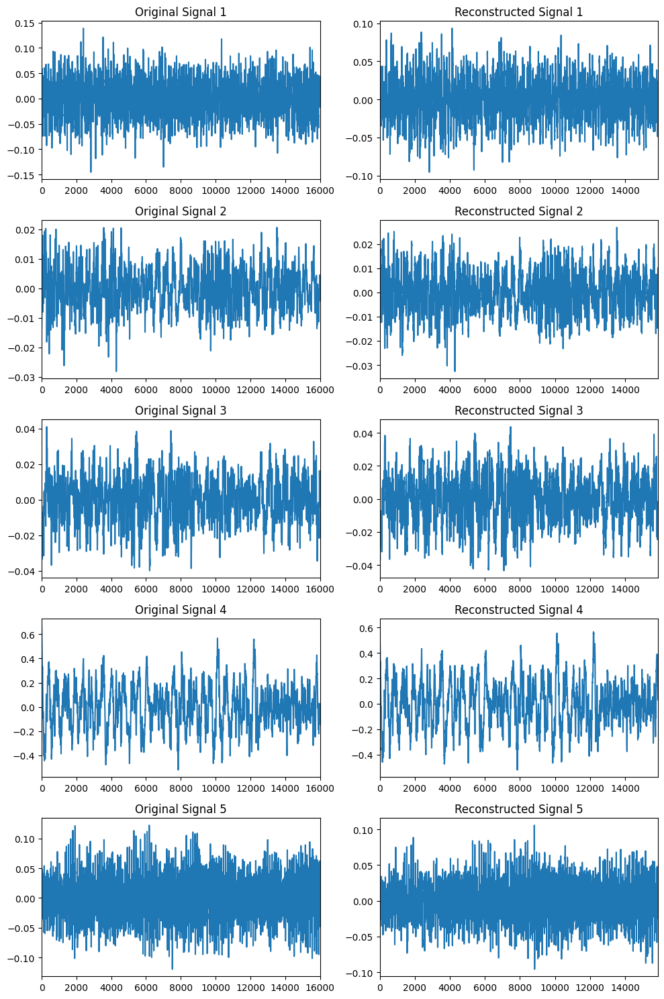

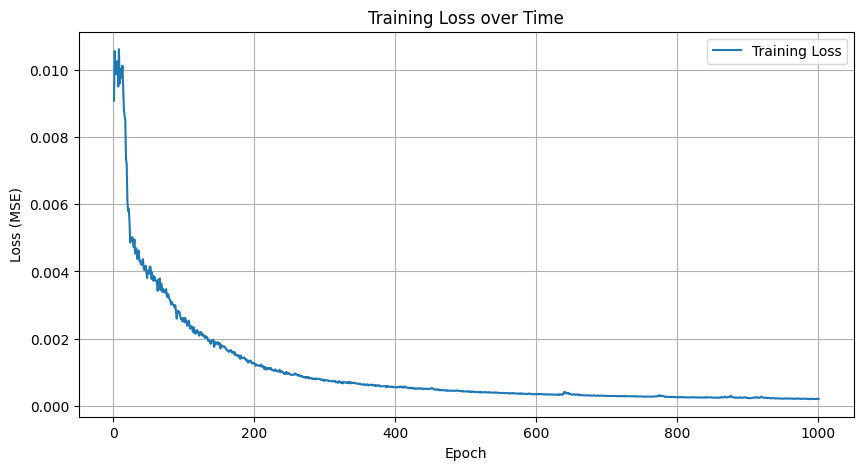

In [20]:
# model training

# Load training audio
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-1.wav")

# Create dataset and data loader
segment_length = 16000  # Define the length of each audio segment (e.g., 1 second at 16 kHz)
dataset = AudioDataset(audio_signal, segment_length)  # Initialize the dataset with audio segments
data_loader = DataLoader(dataset, batch_size=32, shuffle=True)  # Create data loader for batching


# Initialize model, loss, optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConvAutoencoder().to(device)

# Train the model
num_epochs = 1001
train_autoencoder(model, data_loader, num_epochs, device)

Original signal size (number of elements): 874006
Shape of latent representation: torch.Size([1, 64, 1708])
Size of latent representation (number of elements): 109312


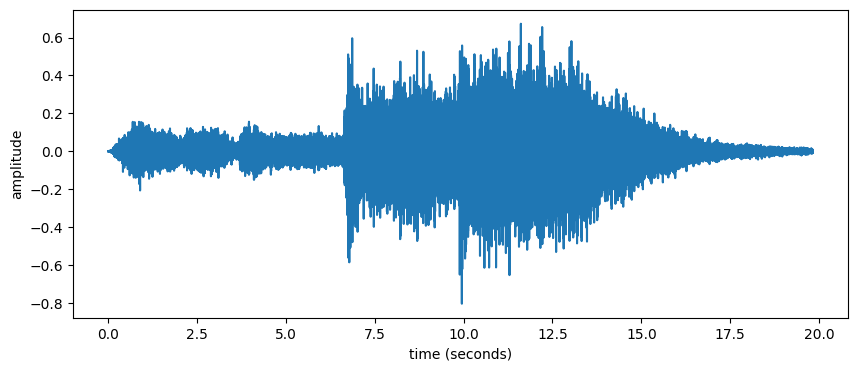

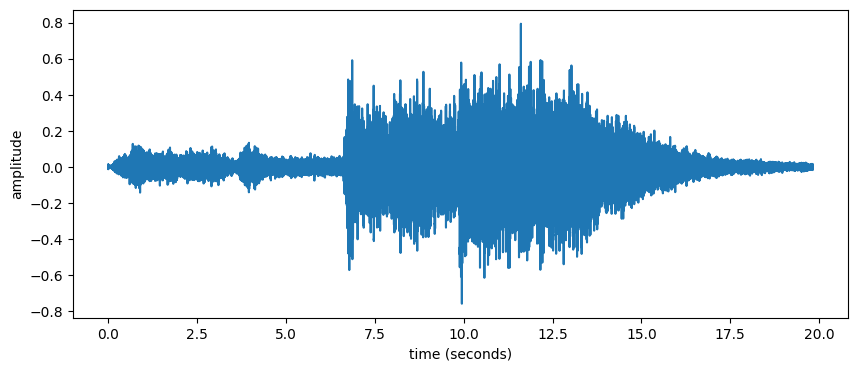

In [ ]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-1.wav")
latent_rep = encode_audio(model, audio_signal, device)
reconstructed_signal = decode_audio(model, latent_rep, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

Original signal size (number of elements): 874006
Shape of latent representation: torch.Size([1, 64, 1708])
Size of latent representation (number of elements): 109312


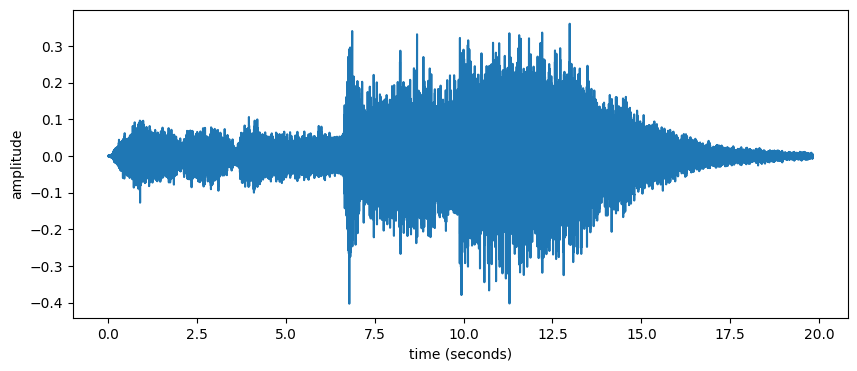

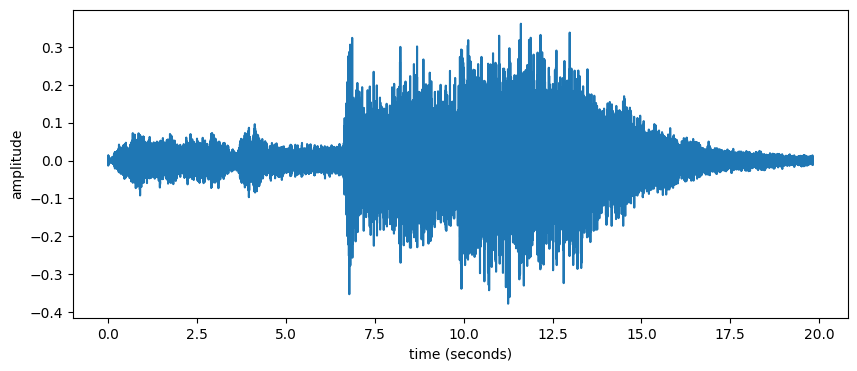

In [ ]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-2.wav")
latent_rep = encode_audio(model, audio_signal, device)
reconstructed_signal = decode_audio(model, latent_rep, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

Original signal size (number of elements): 112076
Shape of latent representation: torch.Size([1, 64, 219])
Size of latent representation (number of elements): 14016


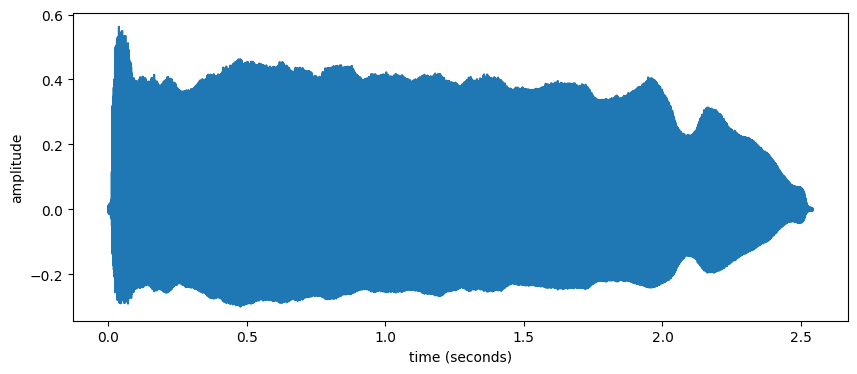

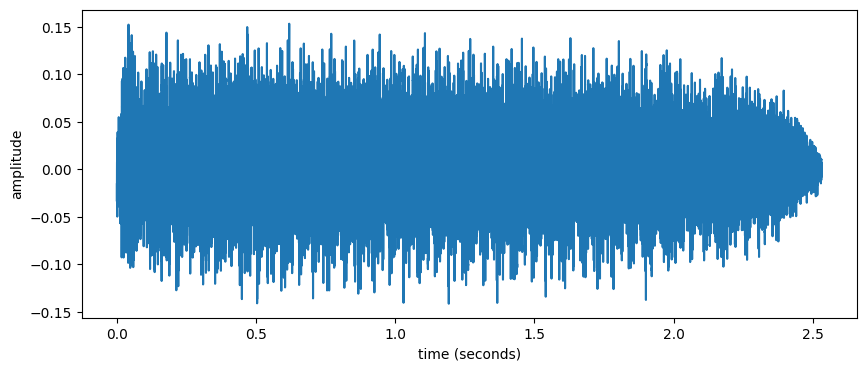

In [ ]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/487465-trumpet.wav")
latent_rep = encode_audio(model, audio_signal, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

reconstructed_signal = decode_audio(model, latent_rep, device)

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

In [ ]:
from torchinfo import summary

# Print the model summary
summary(model, input_size=(1, 16000))  # Input size: (Channels, Length)

Layer (type:depth-idx)                   Output Shape              Param #
ConvAutoencoder                          [1, 15874]                --
├─Sequential: 1-1                        [64, 32]                  --
│    └─Conv1d: 2-1                       [1024, 32]                2,098,176
│    └─ReLU: 2-2                         [1024, 32]                --
│    └─Conv1d: 2-3                       [256, 32]                 262,400
│    └─ReLU: 2-4                         [256, 32]                 --
│    └─Conv1d: 2-5                       [64, 32]                  16,448
│    └─ReLU: 2-6                         [64, 32]                  --
├─Sequential: 1-2                        [1, 15874]                --
│    └─ConvTranspose1d: 2-7              [256, 32]                 16,640
│    └─ReLU: 2-8                         [256, 32]                 --
│    └─ConvTranspose1d: 2-9              [1024, 32]                263,168
│    └─ReLU: 2-10                        [1024, 32]         